**Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

[//]: # (Image References)

[image1]: ./examples/undistort_output.png "Undistorted"
[image2]: ./test_images/test1.jpg "Road Transformed"
[image3]: ./examples/binary_combo_example.jpg "Binary Example"
[image4]: ./examples/warped_straight_lines.jpg "Warp Example"
[image5]: ./examples/color_fit_lines.jpg "Fit Visual"
[image6]: ./examples/example_output.jpg "Output"
[video1]: ./project_video.mp4 "Video"


## [Rubric](https://review.udacity.com/#!/rubrics/571/view) Points

### Here I will consider the rubric points individually and describe how I addressed each point in my implementation.  

In [1]:
import glob
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### Camera Calibration

#### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

The code for this step is contained in the first code cell of the IPython notebook located in "./examples/example.ipynb" (or in lines # through # of the file called `some_file.py`).  

I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.  

I then used the output `objpoints` and `imgpoints` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  I applied this distortion correction to the test image using the `cv2.undistort()` function and obtained this result: 

![alt text][image1]

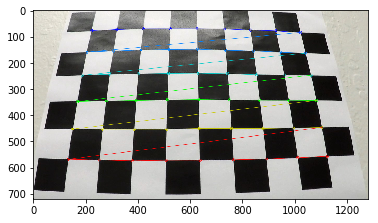

In [2]:
# Sample chess corners - if they were found.
def draw_corners(fname="./camera_cal/calibration3.jpg", nx=9, ny=6):
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(
        gray, (nx,ny),None)
    if ret:
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
    else:
        print("No corners found.")

draw_corners()

In [3]:
def calibrate(path="./camera_cal/calibration*.jpg", nx=9, ny=6):
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane
    
    images = glob.glob(path)
    for i, image in enumerate(images):
        img = mpimg.imread(image)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chess board corners
        ret, corners = cv2.findChessboardCorners(
            gray, (nx,ny),None)

        if ret:
            imgpoints.append(corners)
            objpoints.append(objp)

    # camera matrix, distortion coefficients, rotation and translation vectors.
    ret, mtx, dist, rvecs_unused, tvecs_unused = cv2.calibrateCamera(
        objpoints, imgpoints, gray.shape[::-1], None, None)
    
    return (mtx, dist)

# The camera matrix and distortion coefficients are used for undistoring images.
camera_mtx, dist_coeff = calibrate()

### Pipeline (single images)

#### 1. Provide an example of a distortion-corrected image.

To demonstrate this step, I will describe how I apply the distortion correction to one of the test images like this one:
![alt text][image2]


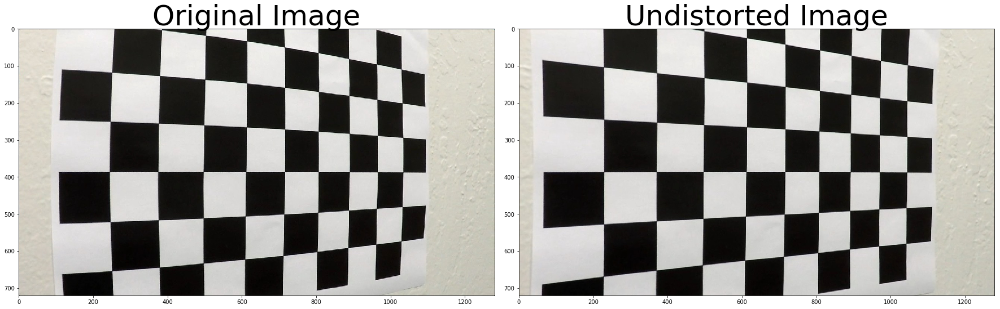

In [4]:
def undistort(mtx, dist, fname="./camera_cal/calibration5.jpg", display=False):
    """Returns undistorted destination image."""
    img = mpimg.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(undistorted)
        ax2.set_title('Undistorted Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return undistorted

_ = undistort(camera_mtx, dist_coeff, display=True)

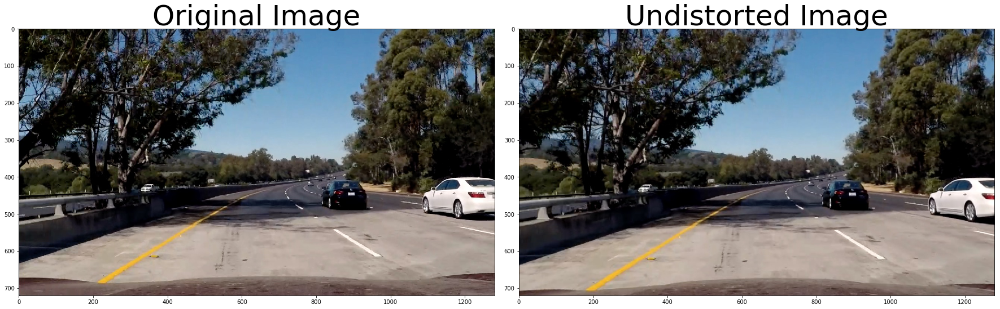

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


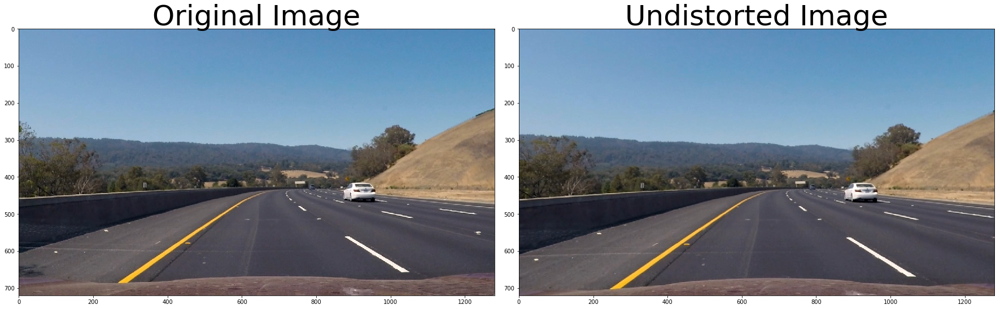

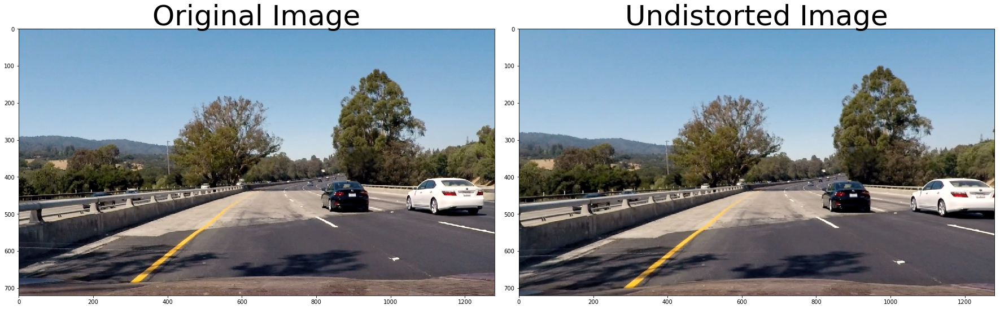

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


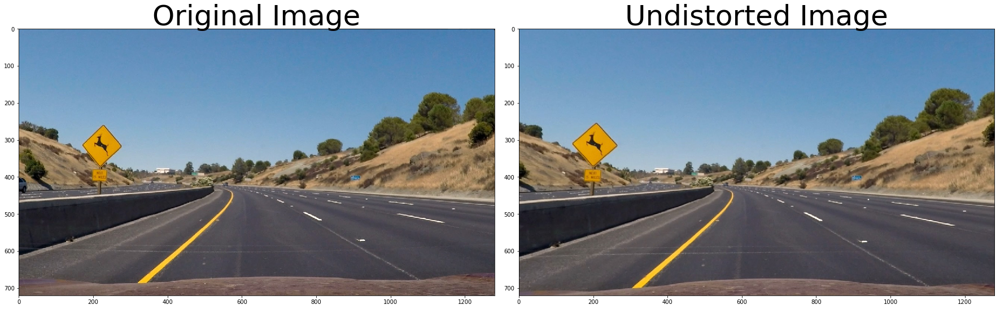

In [5]:
for image in glob.glob('test_images/test*.jpg'):
    undistort(camera_mtx, dist_coeff, fname=image, display=True)

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output    

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)

    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag > mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)    
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    return dir_binary

def combined_thresholds(undist):
    # Choose a Sobel kernel size
    #ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(undist, orient='x', sobel_kernel=3, thresh=(20, 100))
    grady = abs_sobel_thresh(undist, orient='y', sobel_kernel=3, thresh=(50, 255))
    
    mag_binary = mag_thresh(undist, sobel_kernel=3, mag_thresh=(50, 100))

    dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

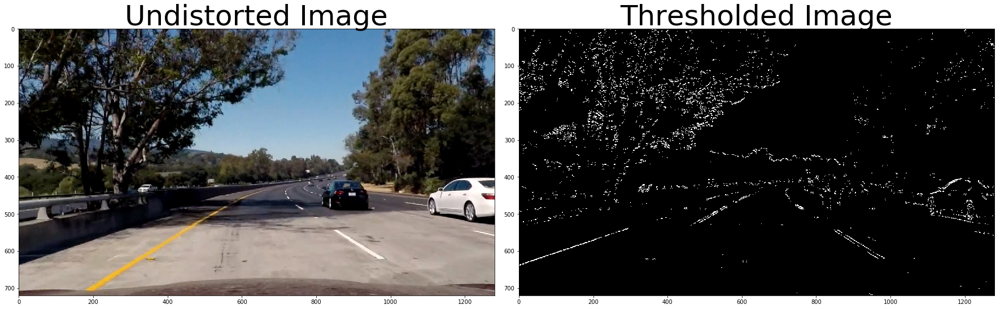

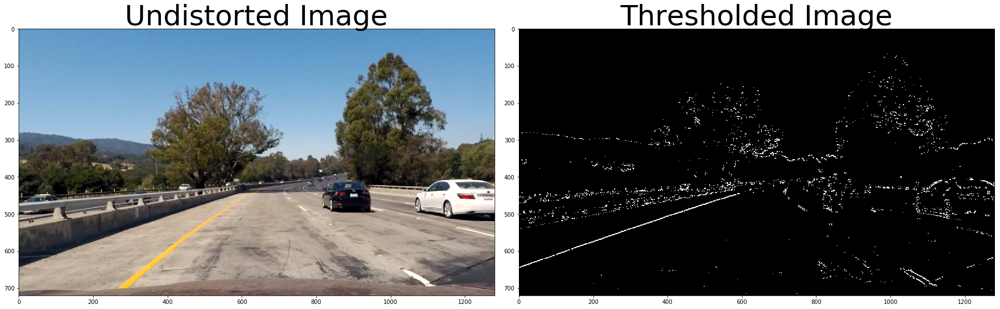

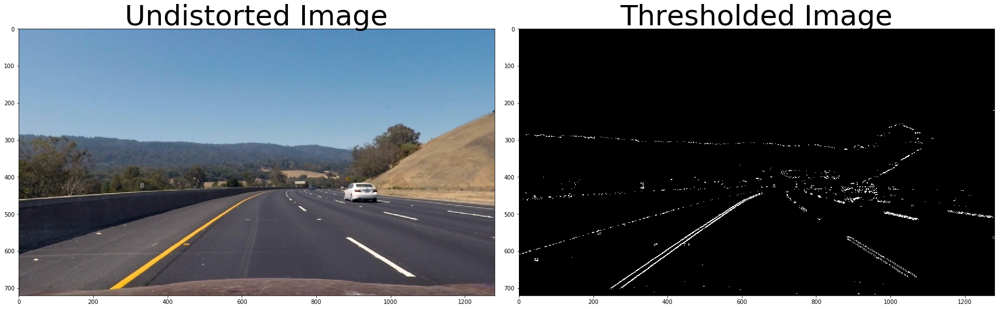

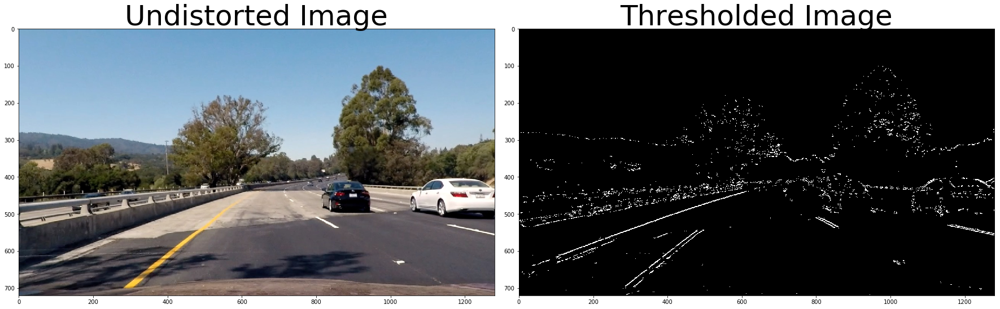

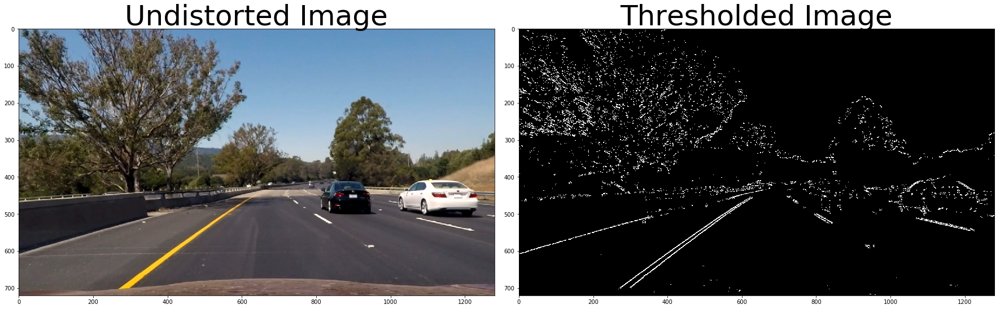

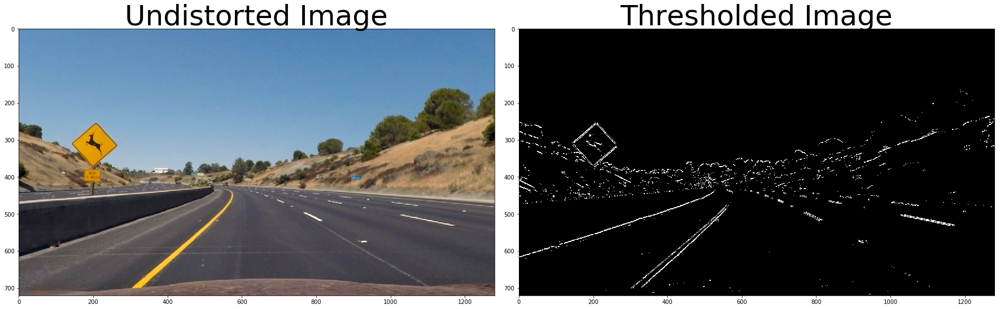

In [7]:
for image in glob.glob('test_images/test*.jpg'):
    undist = undistort(camera_mtx, dist_coeff, fname=image, display=False)
    combined = combined_thresholds(undist)
    
    display = True
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(undist)
        ax1.set_title('Undistorted Image', fontsize=50)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Thresholded Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

I used a combination of color and gradient thresholds to generate a binary image (thresholding steps at lines # through # in `another_file.py`).  Here's an example of my output for this step.  (note: this is not actually from one of the test images)

![alt text][image3]


My comments:
The R channel does a reasonable job of highlighting the line
 S channel picks up the lines well,
 From these examples, you can see that the S channel is probably your best bet. It's cleaner than the H channel result and a bit better than the R channel or simple grayscaling. But it's not clear that one method is far superior to the others. 
  however, is when we step to a new frame, where there are shadows and different colors in the pavement. 
  S channel is preferable because it is more robust to changing  color and contrast conditions
   R channel still does rather well on the white lines, perhaps even better than the S channel. As with gradients, it's worth considering how you might combine various color thresholds to make the most robust identification of the lines. 
   

In [11]:
def hls_select(undis, threshold=(80, 255), type='S'):
    #type = 'H', recommended thresh = (15, 100) 
    #type = 'S', (170, 255)
    hls = cv2.cvtColor(undis, cv2.COLOR_RGB2HLS)
    if type == 'S':
        M = hls[:,:,2]
    elif type == 'H':
        M = hls[:,:,0]
    else: # 'L'
        M = hls[:,:,1]
    binary_output = np.zeros_like(M)
    binary_output[(M > threshold[0]) & (M <= threshold[1])] = 1
    # Return a binary image of threshold result
    return binary_output

def r_channel_select(undis, thresh=(200, 255)):
    R = img[:, :, 0]
    binary_output = np.zeros_like(R)
    binary_output[(R > thresh[0]) & (R <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

In [12]:
def color_gradient_combined(undis, display=False):
    gradient_binary = combined_thresholds(undist)
    color_binary = hls_select(undist, threshold=(80, 255), type='S')
    color_coded = np.dstack(( np.zeros_like(gradient_binary), gradient_binary, color_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(gradient_binary)
    combined_binary[(gradient_binary == 1) | (color_binary == 1)] = 1
    
    return color_coded, combined_binary 

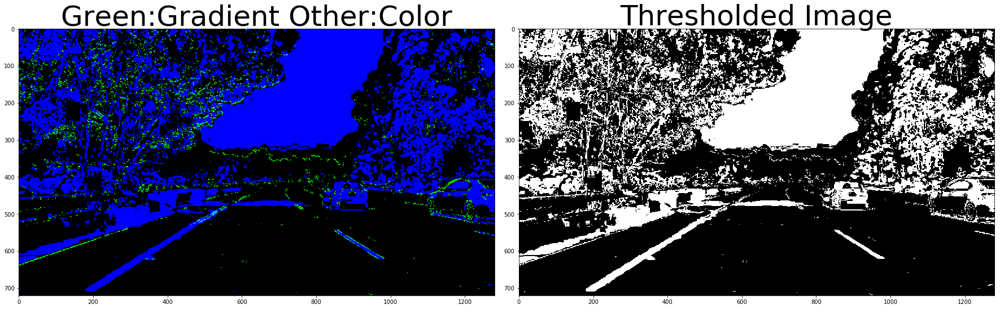

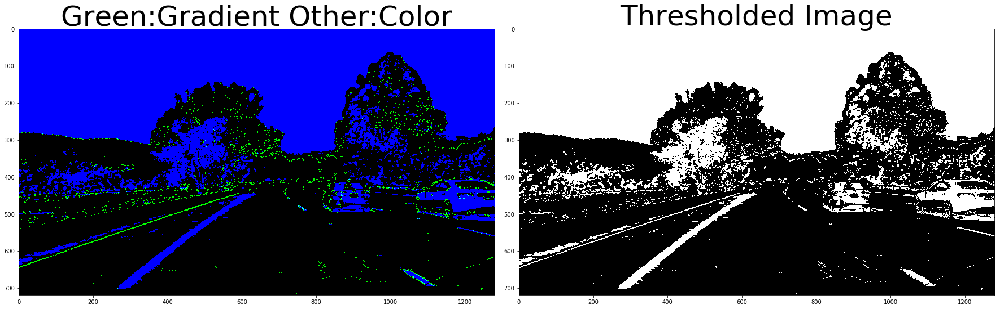

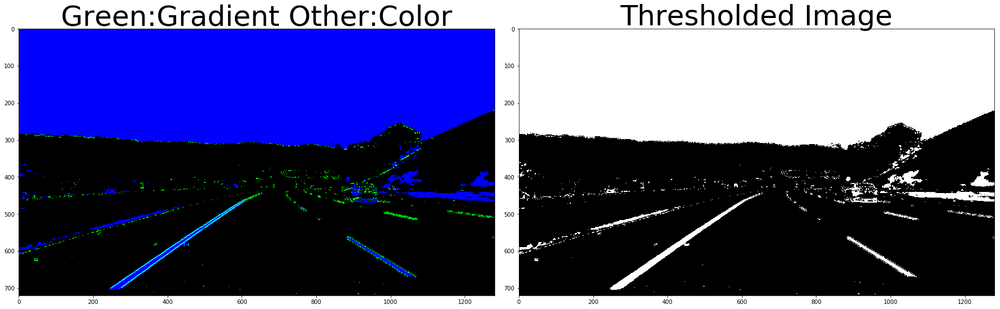

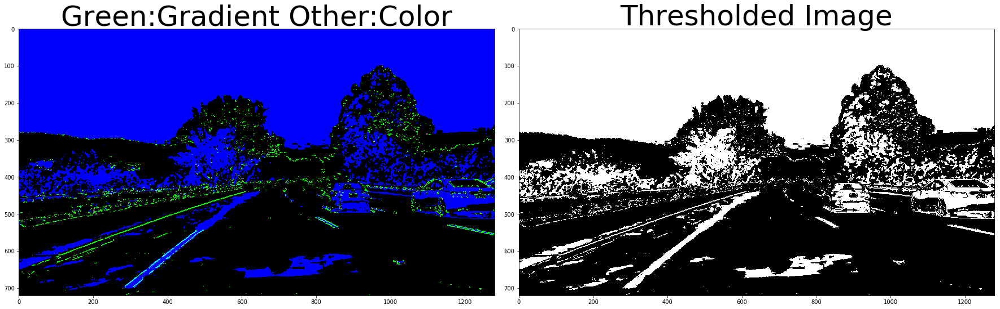

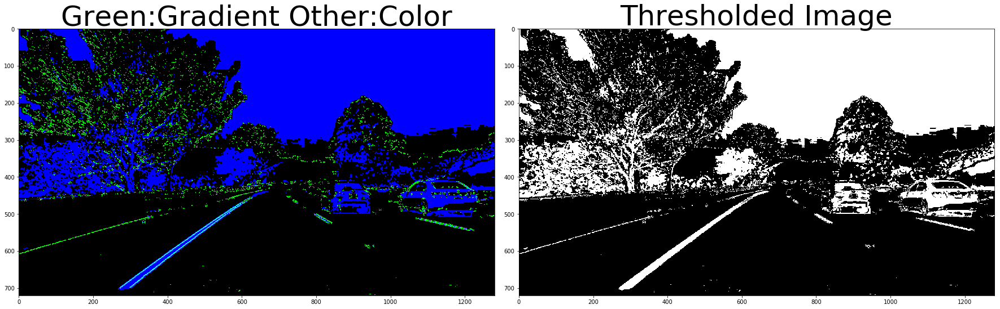

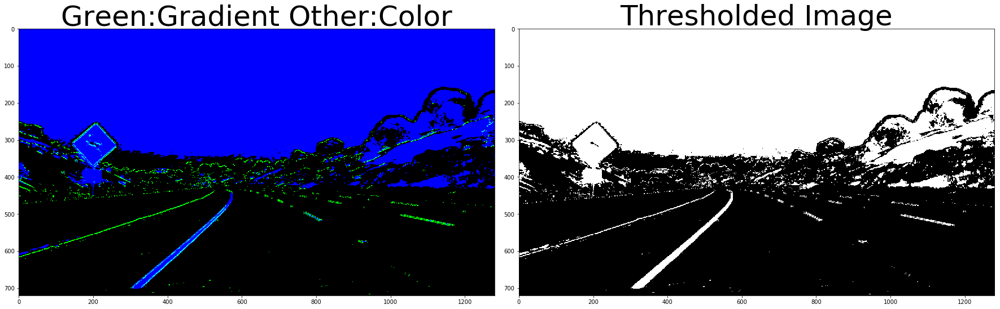

In [14]:
for image in glob.glob('test_images/test*.jpg'):
    undist = undistort(camera_mtx, dist_coeff, fname=image, display=False)
    color_coded, combined_binary = color_gradient_combined(undist)
    
    display = True
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(color_coded)
        ax1.set_title('Green:Gradient Other:Color', fontsize=50)
        ax2.imshow(combined_binary, cmap='gray')
        ax2.set_title('Thresholded Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [17]:
def color_gradient(undis):
    """Given an undistored image, return a color gradient of it."""
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(undis, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane
    # lines
    # Explore gradients in other colors spaces / color channels to see what might work
    #better
    gray = cv2.cvtColor(undis, cv2.COLOR_RGB2GRAY)   
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x

    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx)) 
    
    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue 
    # respectively
    # This returns a stack of the two binary images, whose components you can see as 
    # different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return color_binary, combined_binary

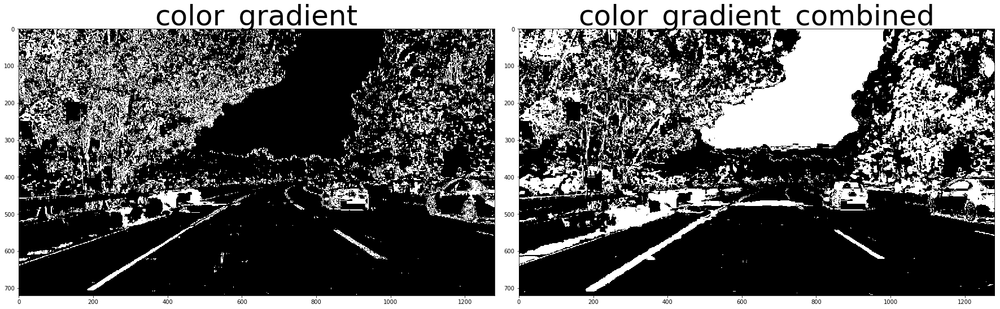

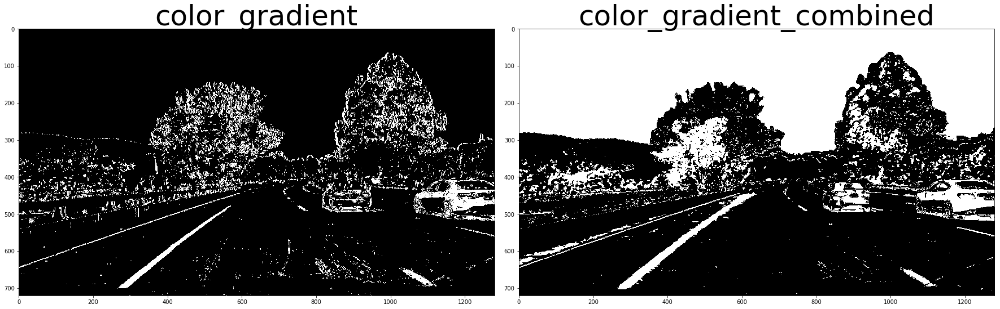

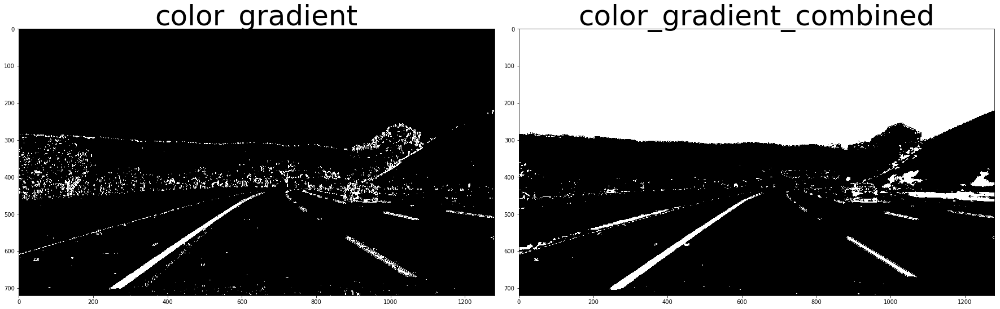

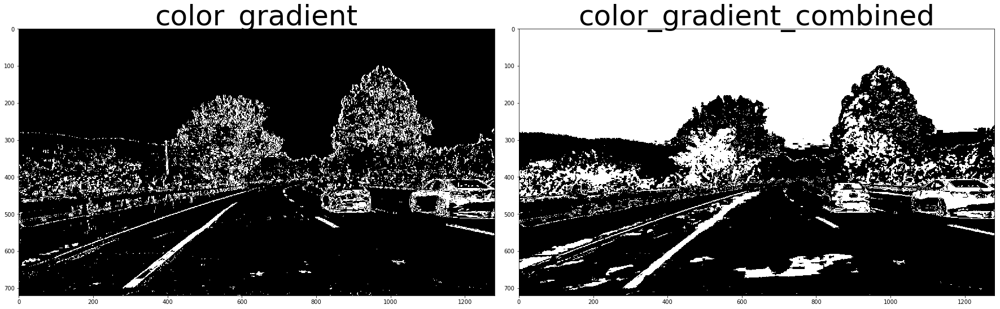

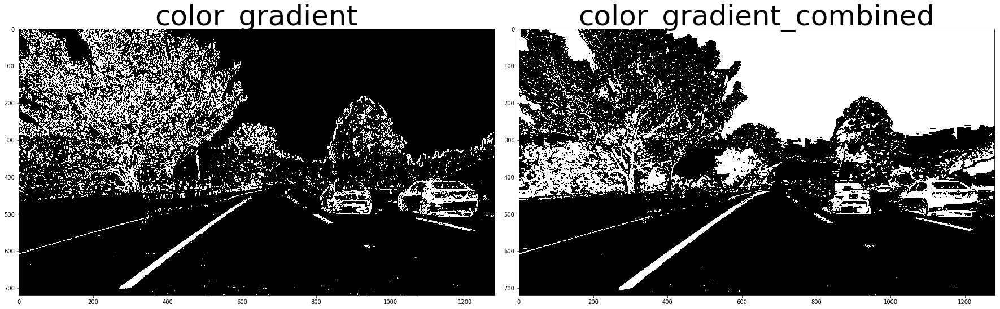

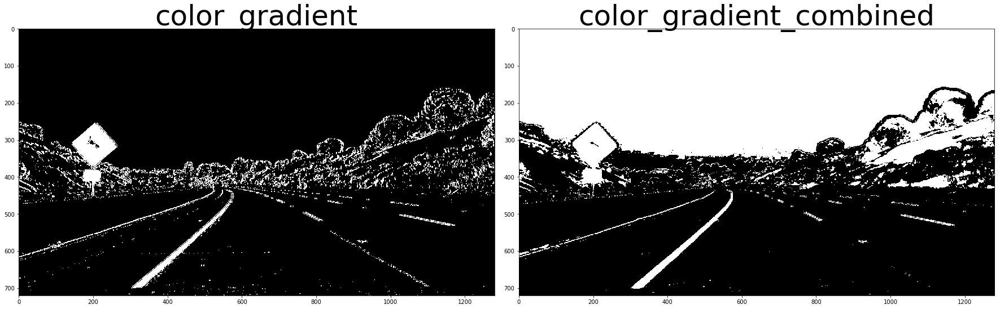

In [20]:
for image in glob.glob('test_images/test*.jpg'):
    undist = undistort(camera_mtx, dist_coeff, fname=image, display=False)
    _, combined_binary = color_gradient(undist)
    _, combined_binary2 = color_gradient_combined(undist)
    
    display = True
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(combined_binary, cmap='gray')
        ax1.set_title('color_gradient', fontsize=50)
        ax2.imshow(combined_binary2, cmap='gray')
        ax2.set_title('color_gradient_combined', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [23]:
def pipeline(undis, s_thresh=(170, 255), sx_thresh=(30, 100)):
    # Let's use this one for now.
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(undis, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]

    # Sobel x on the L channel.
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold the saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1    
    return color_binary, combined_binary

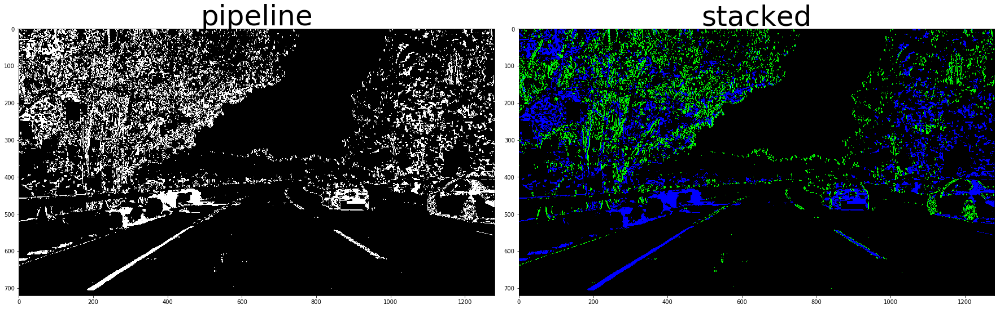

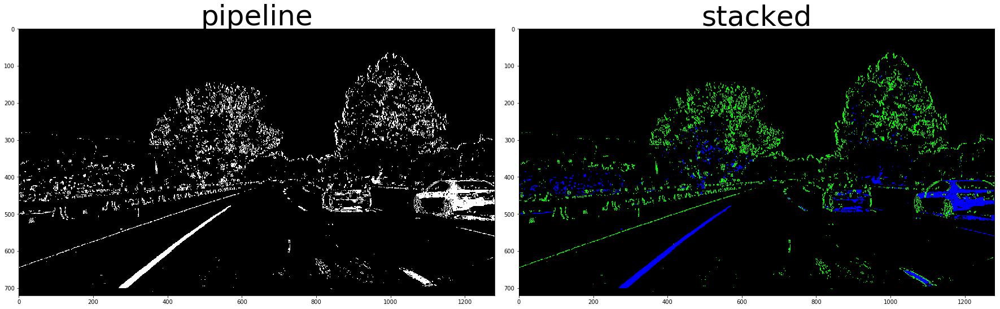

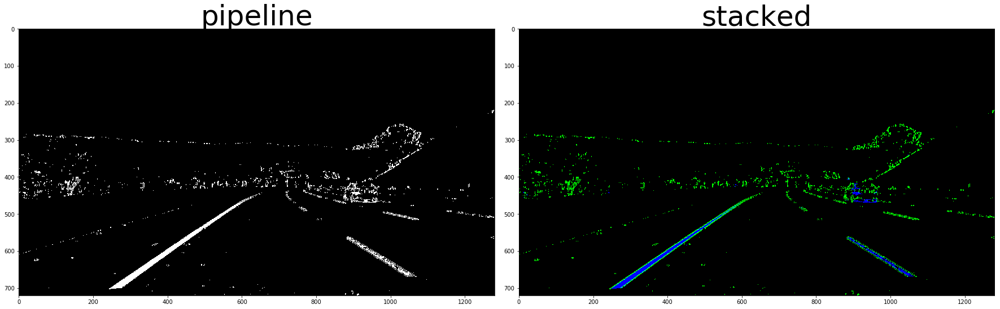

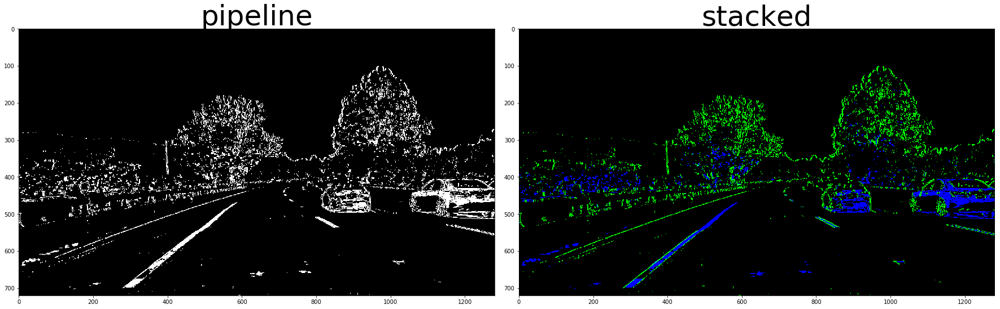

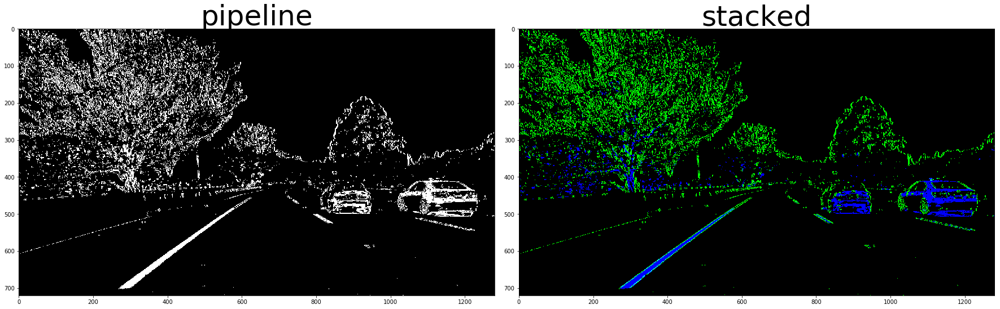

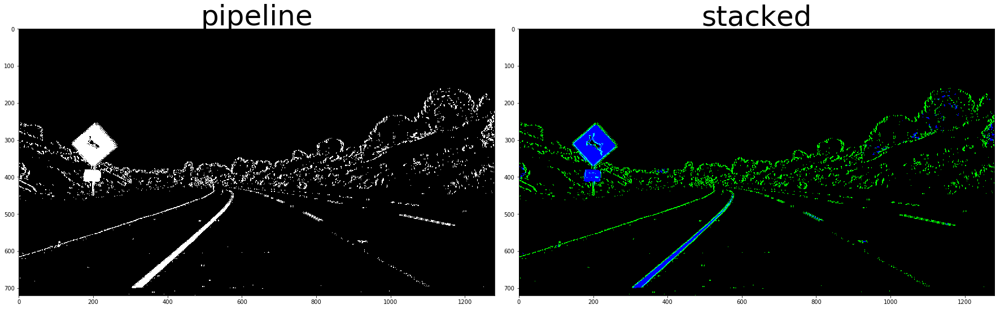

In [25]:
for image in glob.glob('test_images/test*.jpg'):
    undist = undistort(camera_mtx, dist_coeff, fname=image, display=False)
    stacked, combined_binary = pipeline(undist)
    
    display = True
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(combined_binary, cmap='gray')
        ax1.set_title('pipeline', fontsize=50)
        ax2.imshow(stacked, cmap='gray')
        ax2.set_title('stacked', fontsize=50)  # sx -> green, s -> blue
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

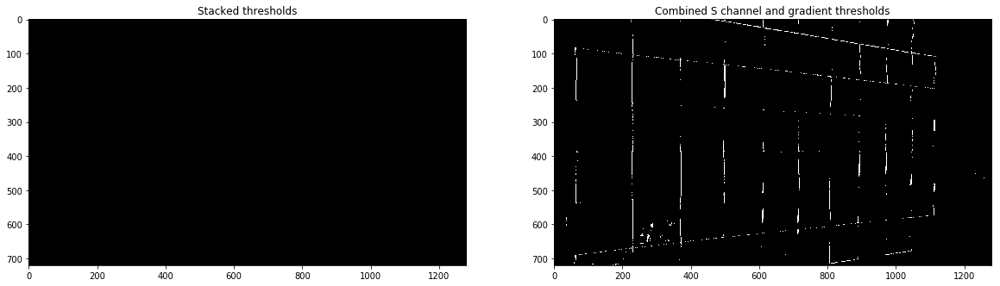

In [36]:
sample_ = undistort(camera_mtx, dist_coeff, display=False)
_ = color_gradient(sample_, display=True)

#### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

The code for my perspective transform includes a function called `warper()`, which appears in lines 1 through 8 in the file `example.py` (output_images/examples/example.py) (or, for example, in the 3rd code cell of the IPython notebook).  The `warper()` function takes as inputs an image (`img`), as well as source (`src`) and destination (`dst`) points.  I chose the hardcode the source and destination points in the following manner:

```python
src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
```

This resulted in the following source and destination points:

| Source        | Destination   | 
|:-------------:|:-------------:| 
| 585, 460      | 320, 0        | 
| 203, 720      | 320, 720      |
| 1127, 720     | 960, 720      |
| 695, 460      | 960, 0        |

I verified that my perspective transform was working as expected by drawing the `src` and `dst` points onto a test image and its warped counterpart to verify that the lines appear parallel in the warped image.

![alt text][image4]


#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

Then I did some other stuff and fit my lane lines with a 2nd order polynomial kinda like this:

![alt text][image5]

#

#### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

I did this in lines # through # in my code in `my_other_file.py`

#

#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

I implemented this step in lines # through # in my code in `yet_another_file.py` in the function `map_lane()`.  Here is an example of my result on a test image:

![alt text][image6]

---

### Pipeline (video)

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

Here's a [link to my video result](./project_video.mp4)

---


### Discussion

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

Here I'll talk about the approach I took, what techniques I used, what worked and why, where the pipeline might fail and how I might improve it if I were going to pursue this project further.  